# SDXL Turbo の実装

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/py-img-gen/python-image-generation/blob/main/notebooks/5-5-2_sdxl-turbo.ipynb)

参考: https://hf.co/docs/diffusers/using-diffusers/sdxl_turbo

## 準備

In [1]:
!pip install -qq py-img-gen

In [2]:
import warnings

import torch

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
dtype = torch.float16
variant = "fp16"
seed = 42

warnings.simplefilter("ignore", FutureWarning)

## SDXL-turbo による Text-to-Image 生成

### SDXL turbo パイプラインの読み込み

In [3]:
import torch
from diffusers import StableDiffusionXLPipeline

model_id = "stabilityai/sdxl-turbo"
pipe_turbo = StableDiffusionXLPipeline.from_pretrained(
    model_id, torch_dtype=dtype, variant=variant
)
pipe_turbo = pipe_turbo.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### テキストから 1 ステップ画像を生成する

  0%|          | 0/1 [00:00<?, ?it/s]

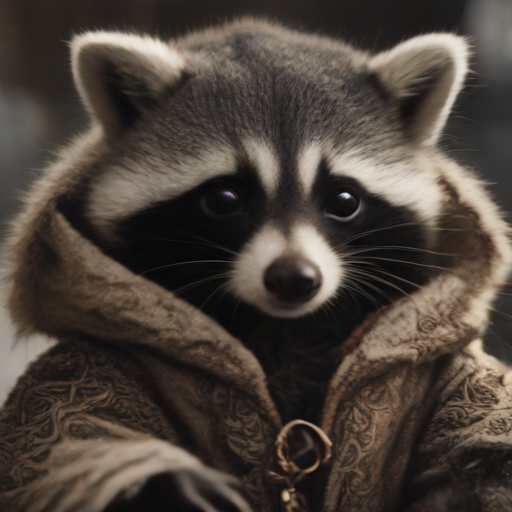

In [4]:
prompt = "A cinematic shot of a baby racoon wearing an intricate italian priest robe."

# guidance_scale を 0.0 に設定して無効にすることを忘れないでください
# SDXL-turbo は CFG を無効にして学習されています
guidance_scale = 0.0

# わずか 1 step で生成してみます！
num_inference_steps = 1

image_turbo = pipe_turbo(
    prompt=prompt,
    guidance_scale=guidance_scale,
    num_inference_steps=num_inference_steps,
    generator=torch.manual_seed(seed),
).images[0]

image_turbo

## SDXL を使って短いステップ数で画像を生成したらどうなるか？

### オリジナルの SDXL パイプラインの読み込み

In [5]:
original_model_id = (
    "stabilityai/stable-diffusion-xl-base-1.0"
)
pipe_original = StableDiffusionXLPipeline.from_pretrained(
    original_model_id,
    torch_dtype=dtype,
    variant=variant,
)
pipe_original = pipe_original.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

### SDXL-turbo に合わせて 1 ステップで画像を生成

  0%|          | 0/1 [00:00<?, ?it/s]

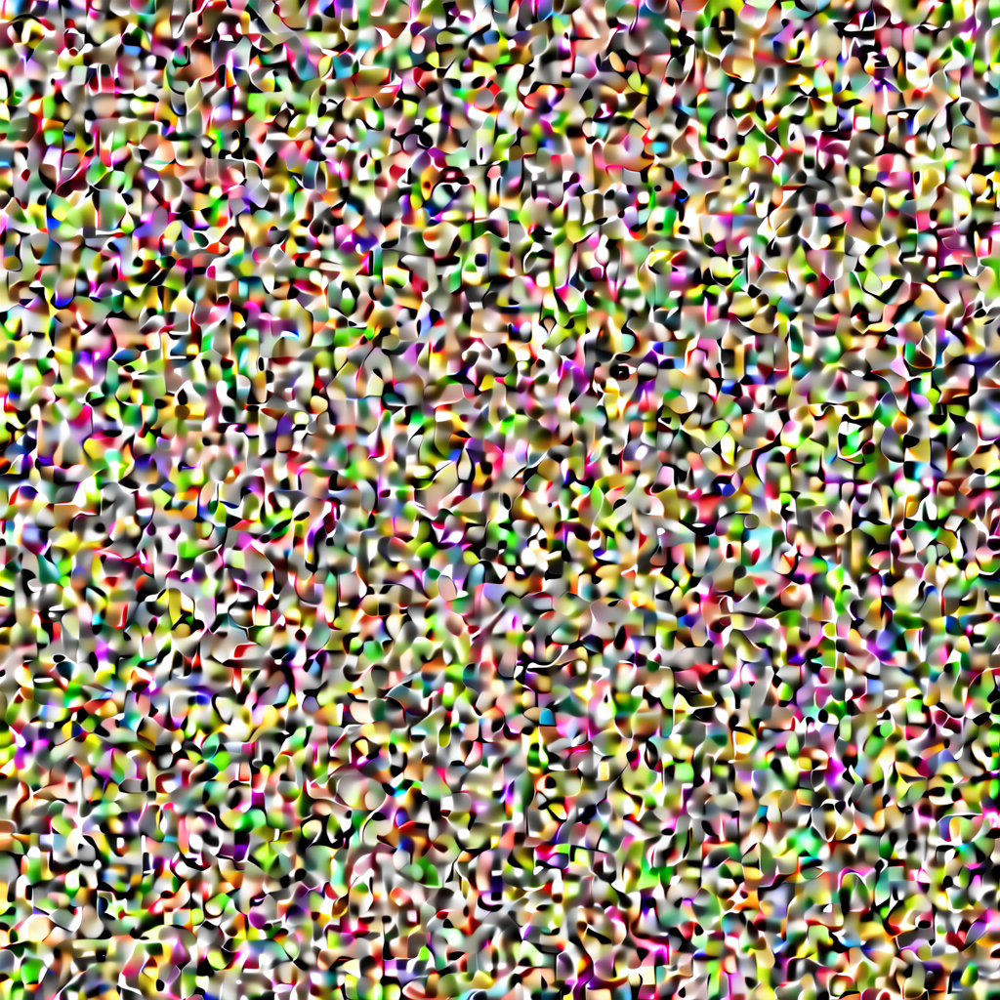

In [6]:
image_original_1step = pipe_original(
    prompt=prompt,
    num_inference_steps=num_inference_steps,
    generator=torch.manual_seed(seed),
).images[0]

image_original_1step

## 10 ステップで画像を生成

  0%|          | 0/10 [00:00<?, ?it/s]

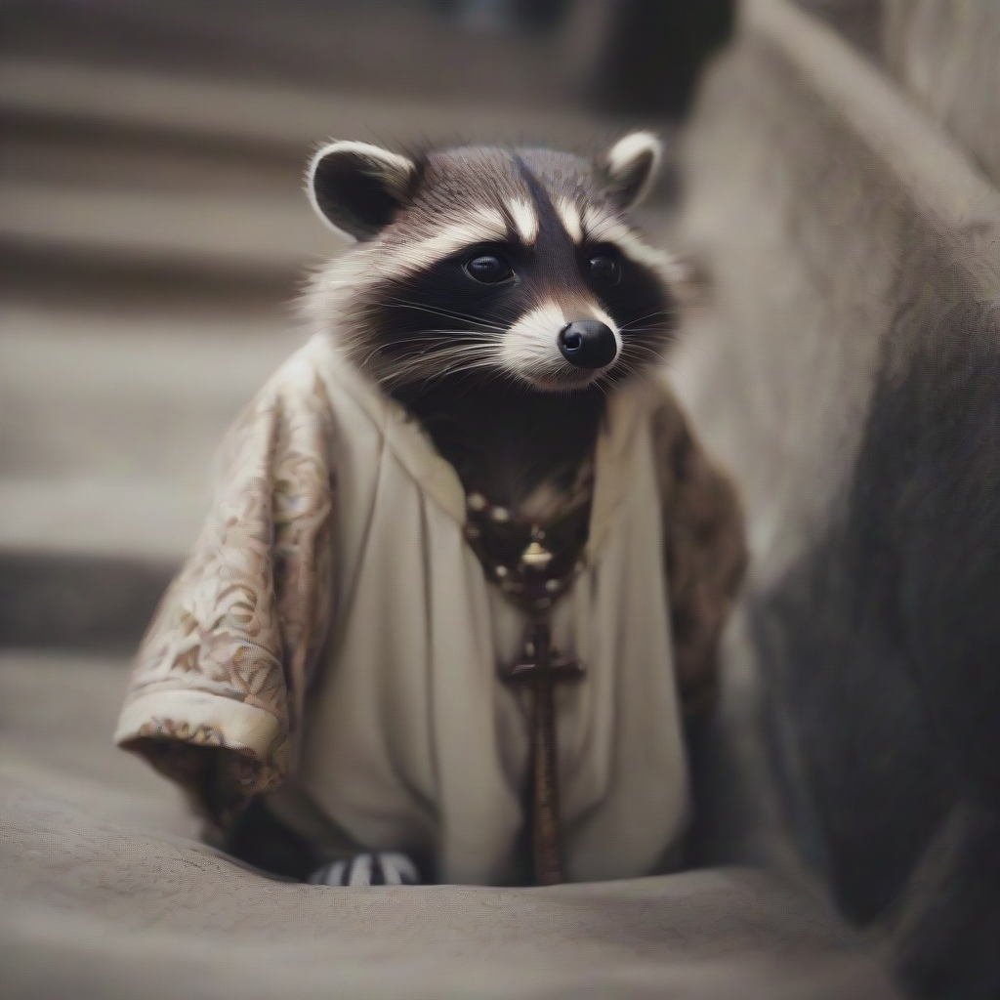

In [7]:
image_original_10step = pipe_original(
    prompt=prompt,
    num_inference_steps=10,
    generator=torch.manual_seed(seed),
).images[0]

image_original_10step

## 50 ステップ (SDXL のデフォルト) で画像を生成

  0%|          | 0/50 [00:00<?, ?it/s]

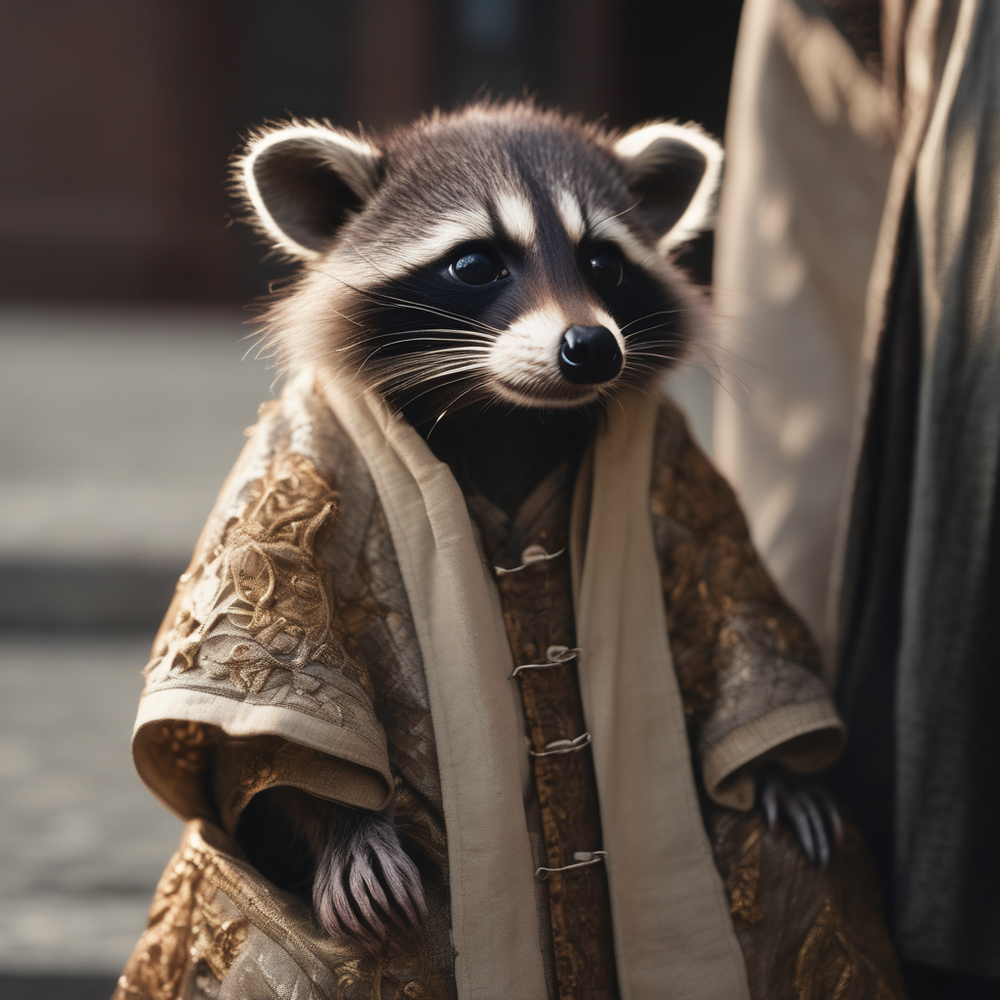

In [8]:
image_original_50step = pipe_original(
    prompt=prompt,
    generator=torch.manual_seed(seed),
).images[0]

image_original_50step

## [Latent Consistency Model (LCM)](https://arxiv.org/abs/2310.04378) との比較

### SDXL に LCM を導入

In [9]:
from diffusers import LCMScheduler, UNet2DConditionModel

unet = UNet2DConditionModel.from_pretrained(
    "latent-consistency/lcm-sdxl",
    torch_dtype=dtype,
    variant=variant,
)

pipe_lcm = StableDiffusionXLPipeline.from_pretrained(
    model_id,
    unet=unet,
    torch_dtype=dtype,
    variant=variant,
)
pipe_lcm = pipe_lcm.to(device)
pipe_lcm.scheduler = LCMScheduler.from_config(
    pipe_lcm.scheduler.config
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

The config attributes {'interpolation_type': 'linear', 'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


### LCM を使って 1 ステップで画像を生成

  0%|          | 0/1 [00:00<?, ?it/s]

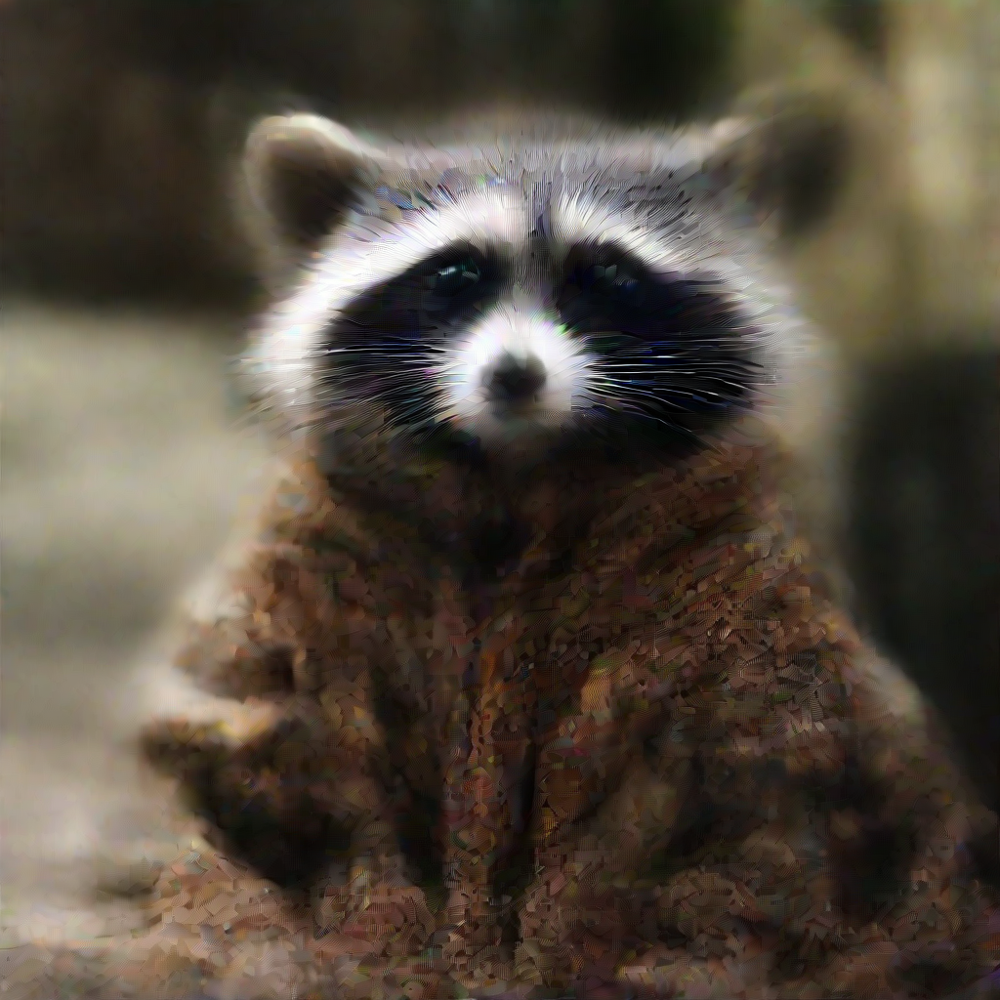

In [10]:
image_lcm_1step = pipe_lcm(
    prompt=prompt,
    num_inference_steps=1,
    generator=torch.manual_seed(seed),
).images[0]

image_lcm_1step

### 4 ステップ （LCM のデフォルト） で画像を生成

  0%|          | 0/4 [00:00<?, ?it/s]

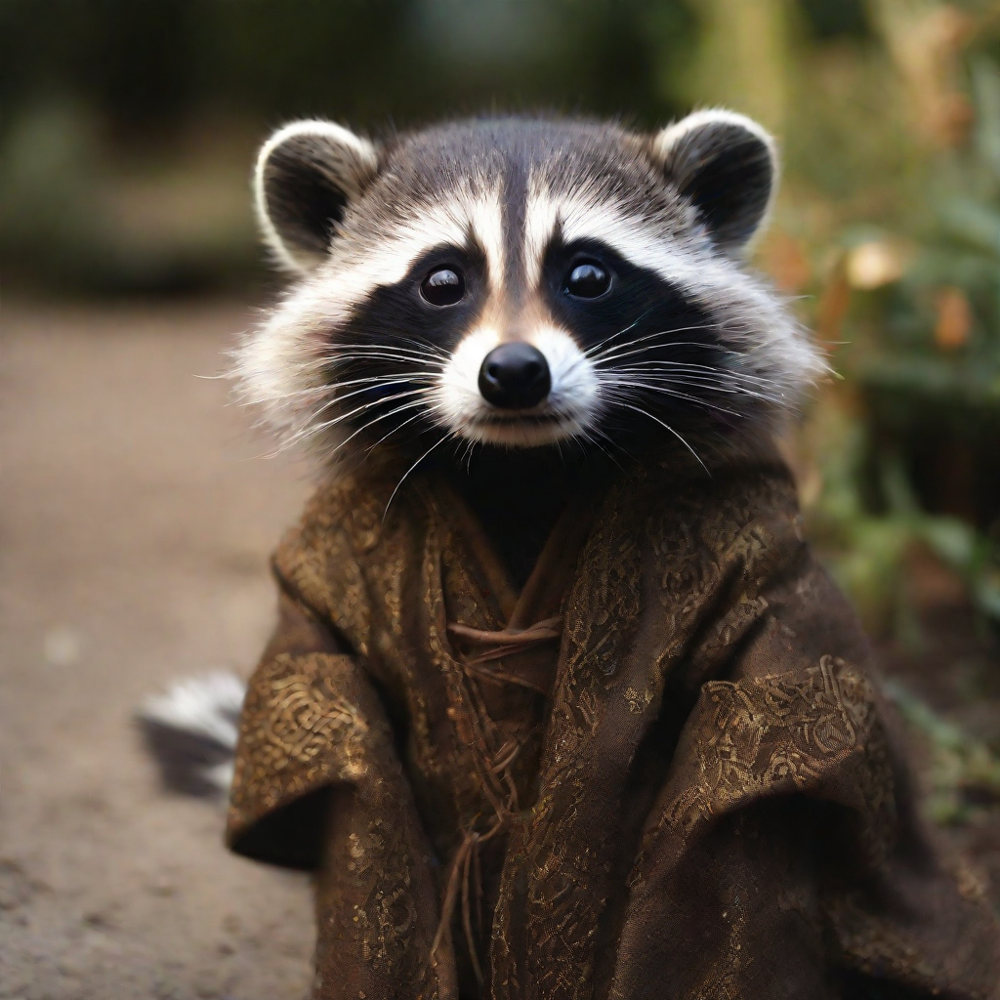

In [11]:
image_lcm_4step = pipe_lcm(
    prompt=prompt,
    num_inference_steps=4,
    generator=torch.manual_seed(seed),
).images[0]

image_lcm_4step

## 生成結果の比較

- SDXL-turbo (1ステップ)
- SDXL (1ステップ)
- SDXL (10ステップ)
- SDXL (50ステップ; デフォルト)
- LCM (1ステップ)
- LCM (4ステップ; デフォルト)

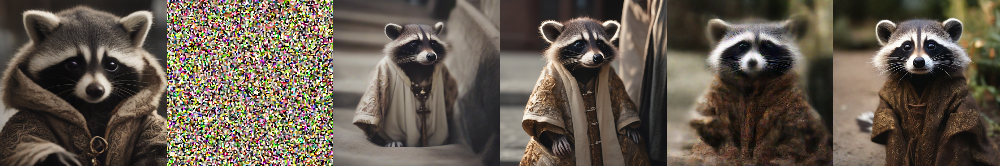

In [12]:
from diffusers.utils import make_image_grid

images = [
    image_turbo,
    image_original_1step,
    image_original_10step,
    image_original_50step,
    image_lcm_1step,
    image_lcm_4step,
]
images = list(
    map(lambda img: img.resize((512, 512)), images)
)
make_image_grid(images, rows=1, cols=len(images))